# Diabetes Classification 

In this notebook, I'll be using the <b>Diabetes Dataset</b> (From https://www.kaggle.com/datasets/akshaydattatraykhare/diabetes-dataset/data).<br>
#### Brief Description
This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective of the dataset is to diagnostically predict whether a patient has diabetes, based on certain diagnostic measurements included in the dataset.<br>
#### Attribute description 

<b>Pregnancies:</b> To express the Number of pregnancies

<b>Glucose:</b> To express the Glucose level in blood

<b>BloodPressure:</b> To express the Blood pressure measurement

<b>SkinThickness:</b> To express the thickness of the skin

<b>Insulin:</b> To express the Insulin level in blood

<b>BMI:</b> To express the Body mass index

<b>DiabetesPedigreeFunction:</b> To express the diabetes likelihood depending on the subject's age and his/her diabetic family history

<b>Age:</b> To express the age

<b>Outcome:</b> To express the final result 1 is Yes and 0 is No

In [42]:
import numpy as np
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from decision_tree import *
from NN_framework import NeuralNet
from ydata_profiling import ProfileReport
from RF_imputer import RF_imputer
import sys
from sklearn import metrics
np.set_printoptions(threshold=sys.maxsize)

In [2]:
THRESH = 0.5

In [3]:
file = 'datasets/diabetes.csv'
df = pd.read_csv(file)
df.shape

(768, 9)

In [4]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [5]:
df.tail()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


## Dataset Overview

In [6]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In the above report, we can see that there are a lot of zeros in the Glucose, BloodPressure, SkinThickness, Insulin, and BMI attributes, but these variables can not assume zero values. <b>This means that zero represents missing values for these attributes</b>

## Handling missing data

<b>I'll use random forests to handle missing values.</b><br>
The specific method used is described in this video - https://youtu.be/sQ870aTKqiM?si=syGqrGv_91dCshNO

In [7]:
X_raw, y = df.values[:, 0:8], df.values[:, -1]

print(f"X_raw shape: {X_raw.shape}")
print(f"y shape: {y.shape}")

X_raw shape: (768, 8)
y shape: (768,)


In [8]:
attribute_types = {0: 'C', 1: 'C', 2: 'C', 3: 'C', 4: 'C', 5: 'C', 6:'C', 7:'C'}
target_columns = [1,2,3,4,5]
X_refined = RF_imputer(X=X_raw, y=y, placeholder=0, attribute_types=attribute_types, target_columns=target_columns, 
                       iterations=10, num_trees=100, num_features=4, max_depth=7)

At iteration: 1
At iteration: 2
At iteration: 3
At iteration: 4
At iteration: 5
At iteration: 6
At iteration: 7
At iteration: 8
At iteration: 9
At iteration: 10


In [18]:
new_df = pd.concat([pd.DataFrame(X_refined, columns=df.columns[0:8]), pd.DataFrame(y, columns=[df.columns[-1]])], axis=1)

In [19]:
ProfileReport(new_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The distribution for all the variables looks much better now.

There are no discrete attributes, so there's no need for one-hot encoding.

<AxesSubplot:>

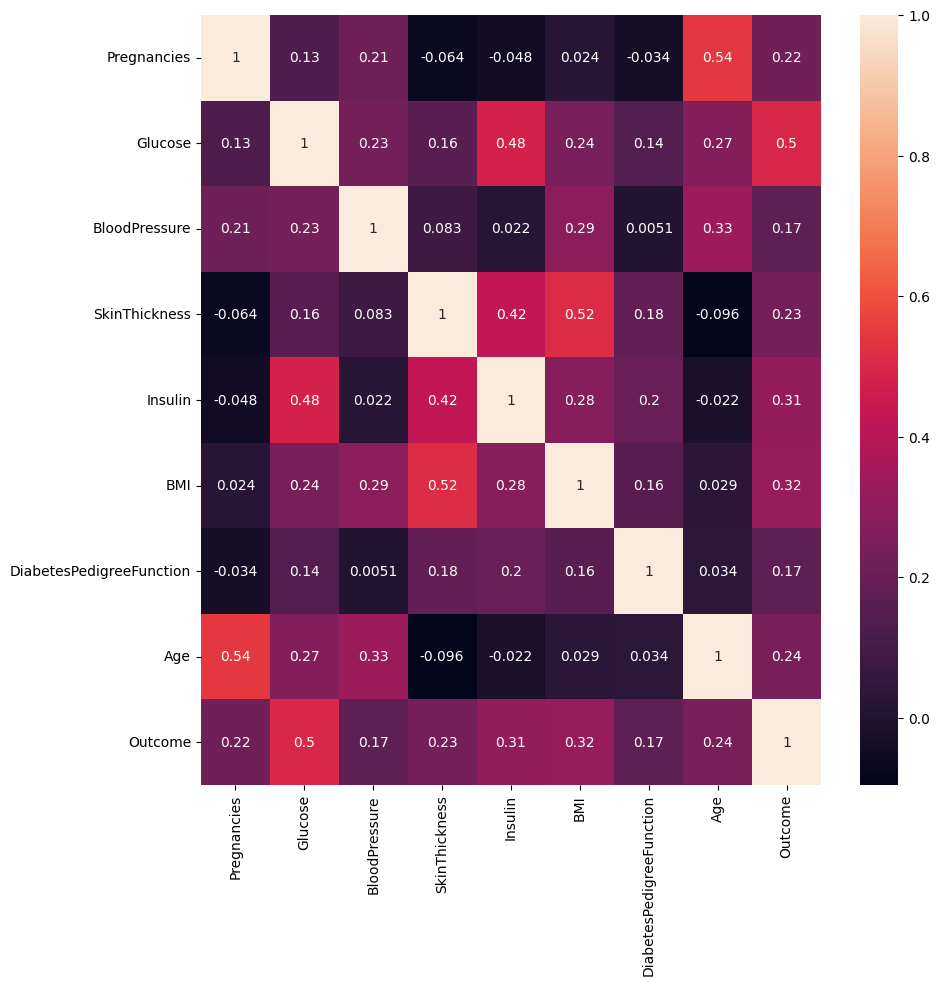

In [24]:
plt.figure(figsize=(10,10))
sns.heatmap(new_df.corr(),annot=True)

## Train and Cross validation split

In [25]:
def split_data(X, y, ratio):
    m = X.shape[0]
    randix = np.random.permutation(m)
    
    m_cv = (m*ratio[1])//100
    m_test = (m*ratio[2])//100

    at_index = 0

    X_cv = X[randix[0: m_cv]]
    y_cv = y[randix[0: m_cv]]
    X_test = X[randix[m_cv: m_test+m_cv]]
    y_test = y[randix[m_cv: m_test+m_cv]]
    X_train = X[randix[m_test+m_cv: ]]
    y_train = y[randix[m_test+m_cv: ]]

    return X_train, y_train, X_cv, y_cv, X_test, y_test 

In [28]:
X_train, y_train, X_cv, y_cv, _, _ = split_data(X_refined, y, (80, 20, 0))

print(f"X_train.shape: {X_train.shape}")
print(f"y_train.shape: {y_train.shape}")
print(f"Train set info--> 1: {np.count_nonzero(y_train==1)} | 0: {np.count_nonzero(y_train==0)}")
print(f"\n")
print(f"X_cv.shape: {X_cv.shape}")
print(f"y_cv.shape: {y_cv.shape}")
print(f"CV set info--> 1: {np.count_nonzero(y_cv==1)} | 0: {np.count_nonzero(y_cv==0)}")

X_train.shape: (615, 8)
y_train.shape: (615,)
Train set info--> 1: 226 | 0: 389


X_cv.shape: (153, 8)
y_cv.shape: (153,)
CV set info--> 1: 42 | 0: 111


In [29]:
def evaluate_model_performance(y, y_pred, print_opt=True):
    confusion_matrix = metrics.confusion_matrix(y, y_pred)
    accuracy = metrics.accuracy_score(y, y_pred)
    precision = metrics.precision_score(y, y_pred)
    recall = metrics.recall_score(y, y_pred)
    F1_score = metrics.f1_score(y, y_pred)

    if print_opt:
        print(f"Accuracy: {accuracy}")
        print(f"Precision: {precision} | Recall: {recall}")
        print(f"F1 Score: {F1_score}")
    return confusion_matrix, accuracy, precision, recall, F1_score

## Logistic Regression
Logistic regression can be achieved by building a neural network with single layer having sigmoid activation.

<b>Normalising the data</b>

In [30]:
mean = np.mean(X_train, axis=0)
std = np.std(X_train, axis=0)

X_train_norm = (X_train-mean)/std
X_cv_norm = (X_cv-mean)/std

In [37]:
LR = NeuralNet(X_train_norm.T, y_train.reshape(1, (len(y_train))), nodes=[1], activations=['sigmoid'], task='binary')

W1 shape: (1, 8)
b1 shape: (1, 1)
Total Parameters: 9


In [50]:
LR.train(epochs=1000, batch_size=-1, alpha=0.01)

At epoch 0 --> Accuracy: 61.138 | Cost: 0.689956086646718
At epoch 100 --> Accuracy: 76.098 | Cost: 0.47483897197706154
At epoch 200 --> Accuracy: 77.398 | Cost: 0.46500806999393623
At epoch 300 --> Accuracy: 77.398 | Cost: 0.4637769386687934
At epoch 400 --> Accuracy: 77.398 | Cost: 0.4636787023649915
At epoch 500 --> Accuracy: 77.236 | Cost: 0.4636742363206983
At epoch 600 --> Accuracy: 77.236 | Cost: 0.46367412637956845
At epoch 700 --> Accuracy: 77.236 | Cost: 0.4636741249905055
At epoch 800 --> Accuracy: 77.236 | Cost: 0.46367412498209165
At epoch 900 --> Accuracy: 77.236 | Cost: 0.46367412498206967
At epoch 1000 --> Accuracy: 77.236 | Cost: 0.46367412498206967


In [51]:
LR_train_pred = (LR.forward_pass(LR.trained_param, X_train_norm.T) > THRESH).astype(int).reshape(X_train_norm.shape[0])

In [52]:
LR_cv_pred = (LR.forward_pass(LR.trained_param, X_cv_norm.T) > THRESH).astype(int).reshape(X_cv_norm.shape[0])

In [53]:
#Performace on the training set
_, _, _, _, _ = evaluate_model_performance(y_train, LR_train_pred)

Accuracy: 0.7723577235772358
Precision: 0.7287234042553191 | Recall: 0.6061946902654868
F1 Score: 0.6618357487922706


In [54]:
#Performace on the cross-validation set
LR_confusion_matrix, LR_accuracy, LR_precision, LR_recall, LR_F1_score = evaluate_model_performance(y_cv, LR_cv_pred)

Accuracy: 0.7908496732026143
Precision: 0.625 | Recall: 0.5952380952380952
F1 Score: 0.6097560975609756


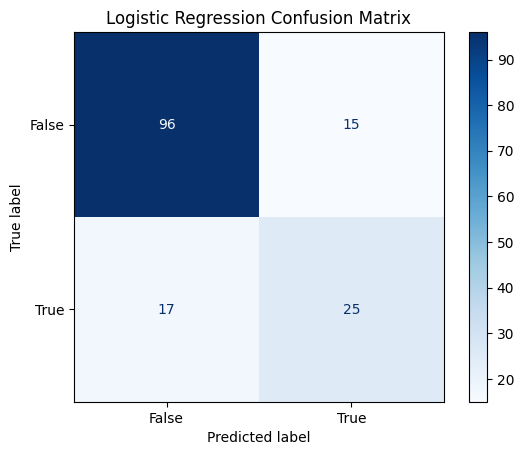

In [55]:
LR_cm_plot = metrics.ConfusionMatrixDisplay(confusion_matrix = LR_confusion_matrix, display_labels = [False, True])
LR_cm_plot.plot(cmap='Blues')
plt.title('Logistic Regression Confusion Matrix')
plt.show()

## Artificial Neural Net

In [75]:
ANN = NeuralNet(X_train_norm.T, y_train.reshape(1, (len(y_train))), nodes=[20, 15, 1], 
                activations=['relu', 'relu', 'sigmoid'], task='binary')

W1 shape: (20, 8)
b1 shape: (20, 1)
W2 shape: (15, 20)
b2 shape: (15, 1)
W3 shape: (1, 15)
b3 shape: (1, 1)
Total Parameters: 511


In [92]:
ANN.train(epochs=2000, batch_size=-1, alpha=0.01, lambd=2)

At epoch 0 --> Accuracy: 36.748 | Cost: 0.6932235869704031
At epoch 200 --> Accuracy: 87.317 | Cost: 0.35414544591557795
At epoch 400 --> Accuracy: 88.455 | Cost: 0.31038218455351607
At epoch 600 --> Accuracy: 89.106 | Cost: 0.30199999179887554
At epoch 800 --> Accuracy: 89.106 | Cost: 0.30146650522740426
At epoch 1000 --> Accuracy: 89.106 | Cost: 0.30141807416488414
At epoch 1200 --> Accuracy: 89.268 | Cost: 0.30097898924901767
At epoch 1400 --> Accuracy: 89.268 | Cost: 0.2998195373909249
At epoch 1600 --> Accuracy: 89.431 | Cost: 0.2996407978919356
At epoch 1800 --> Accuracy: 89.431 | Cost: 0.2996412018982441
At epoch 2000 --> Accuracy: 90.081 | Cost: 0.2933592078761505


In [93]:
ANN_train_pred = (ANN.forward_pass(ANN.trained_param, X_train_norm.T) > THRESH).astype(int).reshape(X_train_norm.shape[0])

In [94]:
ANN_cv_pred = (ANN.forward_pass(ANN.trained_param, X_cv_norm.T) > THRESH).astype(int).reshape(X_cv_norm.shape[0])

In [95]:
#Performance on the training set
_, _, _, _, _ = evaluate_model_performance(y_train, ANN_train_pred)

Accuracy: 0.9008130081300812
Precision: 0.8666666666666667 | Recall: 0.8628318584070797
F1 Score: 0.8647450110864746


In [96]:
#Performance on the cross-validation set
ANN_confusion_matrix, ANN_accuracy, ANN_precision, ANN_recall, ANN_F1_score = evaluate_model_performance(y_cv, ANN_cv_pred)

Accuracy: 0.8366013071895425
Precision: 0.6976744186046512 | Recall: 0.7142857142857143
F1 Score: 0.7058823529411765


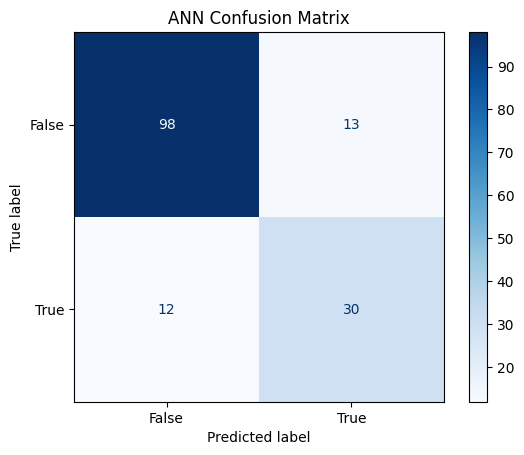

In [97]:
ANN_cm_plot = metrics.ConfusionMatrixDisplay(confusion_matrix = ANN_confusion_matrix, display_labels = [False, True])
ANN_cm_plot.plot(cmap='Blues')
plt.title('ANN Confusion Matrix')
plt.show()

## Decision Tree

In [98]:
DT = DecisionTree(X_train, y_train, task='classification')

In [161]:
DT.build_tree(max_depth=4) #constraints added to prevent over-fitting

 Depth 0,Root: Split on feature: 4
 - Depth 1, Left leaf with indices [  1   3   8  10  20  22  26  40  47  50  52  54  56  60  71  72  73  80
  94  96 100 106 109 116 126 137 139 140 143 150 157 158 165 182 184 192
 198 199 200 201 204 211 217 228 234 235 242 245 249 251 255 258 259 263
 264 269 272 273 289 294 296 298 303 304 307 308 310 319 320 324 331 332
 333 335 344 345 349 356 361 365 366 375 379 381 386 388 399 400 404 405
 409 410 426 431 438 440 447 450 452 453 456 460 461 463 464 470 472 476
 477 480 487 489 491 502 507 524 530 537 541 546 548 549 554 560 561 563
 566 568 570 571 575 584 590 593 597 598 599 601 608 611]
- Depth 1,Right: Split on feature: 7
-- Depth 2,Left: Split on feature: 1
--- Depth 3,Left: Split on feature: 4
    ---- Depth 4, Left leaf with indices [  6   7  12  34  36  41  42  55  58  65  81  84  85  88  91  98 103 105
 122 133 141 144 148 160 162 163 172 181 186 187 196 210 213 222 241 252
 260 265 274 275 280 285 288 295 306 314 322 325 329 347 354 3

In [162]:
DT_train_pred = DT.run_inference(X_train, DT.tree)

In [163]:
#Performance on the training set
_, _, _, _, _ = evaluate_model_performance(y_train, DT_train_pred)

Accuracy: 0.8373983739837398
Precision: 0.794392523364486 | Recall: 0.7522123893805309
F1 Score: 0.7727272727272728


In [164]:
DT_cv_pred = DT.run_inference(X_cv, DT.tree)

In [165]:
#Performance on the cross-validation set
DT_confusion_matrix, DT_accuracy, DT_precision, DT_recall, DT_F1_score = evaluate_model_performance(y_cv, DT_cv_pred)

Accuracy: 0.8627450980392157
Precision: 0.7441860465116279 | Recall: 0.7619047619047619
F1 Score: 0.7529411764705882


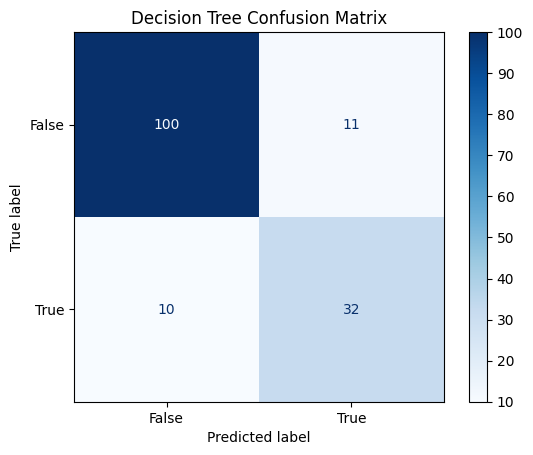

In [166]:
DT_cm_plot = metrics.ConfusionMatrixDisplay(confusion_matrix = DT_confusion_matrix, display_labels = [False, True])
DT_cm_plot.plot(cmap='Blues')
plt.title('Decision Tree Confusion Matrix')
plt.show()

## Bagging

Bagging is achieved by considering all the features at every split. This is done by setting the <i>num_features</i> parameter to 'all'.

In [127]:
BC = RandomForest(X_train, y_train, 'classification')

In [174]:
BC.build_ensemble(num_trees=200, max_depth=8, num_features='all')

Building Tree 1.......
Building Tree 2.......
Building Tree 3.......
Building Tree 4.......
Building Tree 5.......
Building Tree 6.......
Building Tree 7.......
Building Tree 8.......
Building Tree 9.......
Building Tree 10.......
Building Tree 11.......
Building Tree 12.......
Building Tree 13.......
Building Tree 14.......
Building Tree 15.......
Building Tree 16.......
Building Tree 17.......
Building Tree 18.......
Building Tree 19.......
Building Tree 20.......
Building Tree 21.......
Building Tree 22.......
Building Tree 23.......
Building Tree 24.......
Building Tree 25.......
Building Tree 26.......
Building Tree 27.......
Building Tree 28.......
Building Tree 29.......
Building Tree 30.......
Building Tree 31.......
Building Tree 32.......
Building Tree 33.......
Building Tree 34.......
Building Tree 35.......
Building Tree 36.......
Building Tree 37.......
Building Tree 38.......
Building Tree 39.......
Building Tree 40.......
Building Tree 41.......
Building Tree 42.......
B

In [175]:
BC_train_pred = BC.run_inference_on_ensemble(X_train, BC.ensemble)

In [176]:
#Performance on the training set
_, _, _, _, _ = evaluate_model_performance(y_train, BC_train_pred)

Accuracy: 0.9658536585365853
Precision: 0.9596412556053812 | Recall: 0.9469026548672567
F1 Score: 0.9532293986636972


In [177]:
BC_cv_pred = BC.run_inference_on_ensemble(X_cv, BC.ensemble)

In [178]:
#Performance on the cross-validation set
BC_confusion_matrix, BC_accuracy, BC_precision, BC_recall, BC_F1_score = evaluate_model_performance(y_cv, BC_cv_pred)

Accuracy: 0.8431372549019608
Precision: 0.7142857142857143 | Recall: 0.7142857142857143
F1 Score: 0.7142857142857143


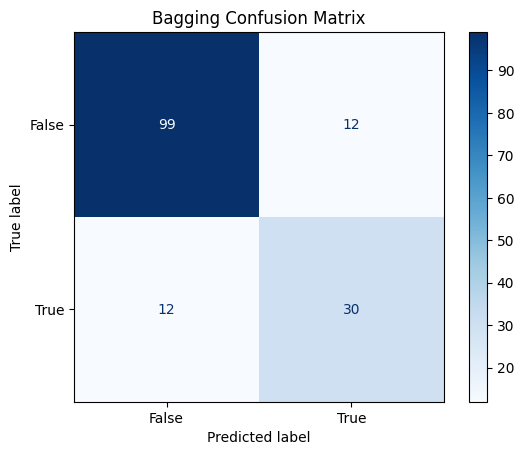

In [180]:
BC_cm_plot = metrics.ConfusionMatrixDisplay(confusion_matrix = BC_confusion_matrix, display_labels = [False, True])
BC_cm_plot.plot(cmap='Blues')
plt.title('Bagging Confusion Matrix')
plt.show()

## Random Forest

In [135]:
RF = RandomForest(X_train, y_train, 'classification')

In [181]:
RF.build_ensemble(num_trees=200, max_depth=4, num_features=5) 

Building Tree 1.......
Building Tree 2.......
Building Tree 3.......
Building Tree 4.......
Building Tree 5.......
Building Tree 6.......
Building Tree 7.......
Building Tree 8.......
Building Tree 9.......
Building Tree 10.......
Building Tree 11.......
Building Tree 12.......
Building Tree 13.......
Building Tree 14.......
Building Tree 15.......
Building Tree 16.......
Building Tree 17.......
Building Tree 18.......
Building Tree 19.......
Building Tree 20.......
Building Tree 21.......
Building Tree 22.......
Building Tree 23.......
Building Tree 24.......
Building Tree 25.......
Building Tree 26.......
Building Tree 27.......
Building Tree 28.......
Building Tree 29.......
Building Tree 30.......
Building Tree 31.......
Building Tree 32.......
Building Tree 33.......
Building Tree 34.......
Building Tree 35.......
Building Tree 36.......
Building Tree 37.......
Building Tree 38.......
Building Tree 39.......
Building Tree 40.......
Building Tree 41.......
Building Tree 42.......
B

In [187]:
RF_train_pred = RF.run_inference_on_ensemble(X_train, RF.ensemble)

In [188]:
#Performance on the training set
_, _, _, _, _ = evaluate_model_performance(y_train, RF_train_pred)

Accuracy: 0.8585365853658536
Precision: 0.7883817427385892 | Recall: 0.8407079646017699
F1 Score: 0.8137044967880085


In [189]:
RF_cv_pred = RF.run_inference_on_ensemble(X_cv, RF.ensemble)

In [190]:
#Performance on the cross-validation set
RF_confusion_matrix, RF_accuracy, RF_precision, RF_recall, RF_F1_score = evaluate_model_performance(y_cv, RF_cv_pred)

Accuracy: 0.8496732026143791
Precision: 0.7317073170731707 | Recall: 0.7142857142857143
F1 Score: 0.7228915662650603


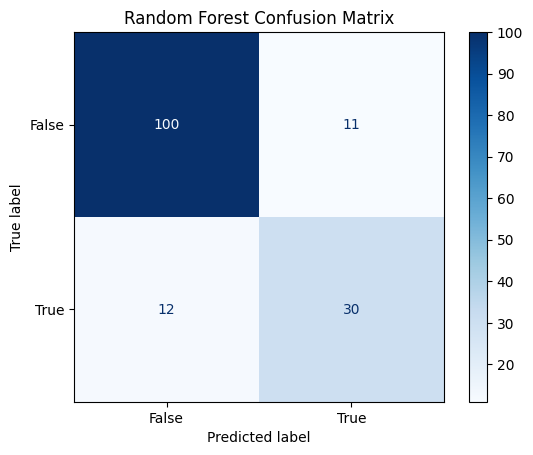

In [191]:
RF_cm_plot = metrics.ConfusionMatrixDisplay(confusion_matrix = RF_confusion_matrix, display_labels = [False, True])
RF_cm_plot.plot(cmap='Blues')
plt.title('Random Forest Confusion Matrix')
plt.show()

## AdaBoost

In [149]:
ABC = AdaBoostClassifier(X_train, y_train)

In [273]:
ABC.train(n_learners=10, depth=4, store_error=True, X_cv=X_cv, y_cv=y_cv, learning_rate=0.5)

Building learner: 1....
Building learner: 2....
Building learner: 3....
Building learner: 4....
Building learner: 5....
Building learner: 6....
Building learner: 7....
Building learner: 8....
Building learner: 9....
Building learner: 10....


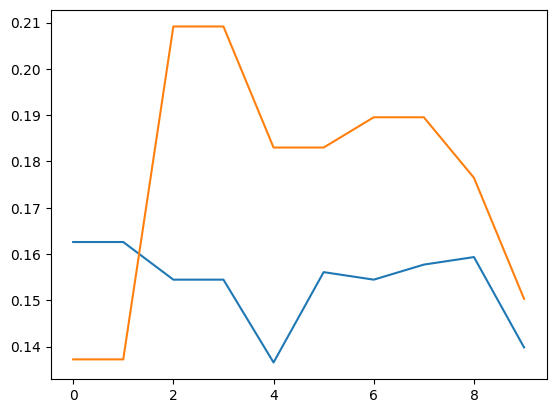

In [274]:
plt.plot(ABC.train_error_hist)
plt.plot(ABC.cv_error_hist)

In [275]:
ABC_train_pred = ABC.predict(X_train, ABC.learners)

In [276]:
#Performance on the training set
_, _, _, _, _ = evaluate_model_performance(y_train, ABC_train_pred)

Accuracy: 0.8601626016260162
Precision: 0.8271028037383178 | Recall: 0.7831858407079646
F1 Score: 0.8045454545454547


In [277]:
ABC_cv_pred = ABC.predict(X_cv, ABC.learners)

In [278]:
#Performance on the cross-validation set
ABC_confusion_matrix, ABC_accuracy, ABC_precision, ABC_recall, ABC_F1_score = evaluate_model_performance(y_cv, ABC_cv_pred)

Accuracy: 0.8496732026143791
Precision: 0.7111111111111111 | Recall: 0.7619047619047619
F1 Score: 0.735632183908046


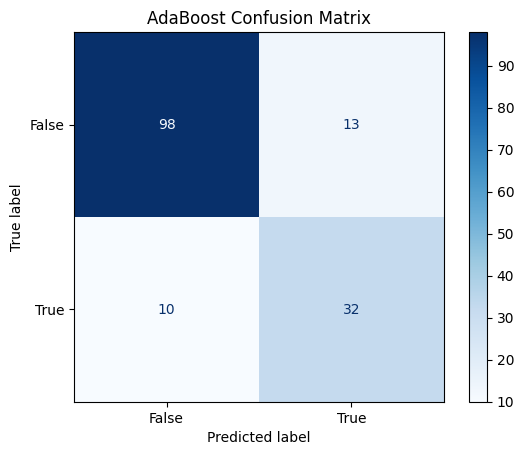

In [279]:
ABC_cm_plot = metrics.ConfusionMatrixDisplay(confusion_matrix = ABC_confusion_matrix, display_labels = [False, True])
ABC_cm_plot.plot(cmap='Blues')
plt.title('AdaBoost Confusion Matrix')
plt.show()

## GradientBoost

In [280]:
GBC = GradientBoostClassifier(X_train, y_train)

In [293]:
GBC.train(learning_rate=0.1, n_trees=400, max_depth=5, store_hist=True, X_cv=X_cv, y_cv=y_cv)

Buidling tree: 1....
Buidling tree: 2....
Buidling tree: 3....
Buidling tree: 4....
Buidling tree: 5....
Buidling tree: 6....
Buidling tree: 7....
Buidling tree: 8....
Buidling tree: 9....
Buidling tree: 10....
Buidling tree: 11....
Buidling tree: 12....
Buidling tree: 13....
Buidling tree: 14....
Buidling tree: 15....
Buidling tree: 16....
Buidling tree: 17....
Buidling tree: 18....
Buidling tree: 19....
Buidling tree: 20....
Buidling tree: 21....
Buidling tree: 22....
Buidling tree: 23....
Buidling tree: 24....
Buidling tree: 25....
Buidling tree: 26....
Buidling tree: 27....
Buidling tree: 28....
Buidling tree: 29....
Buidling tree: 30....
Buidling tree: 31....
Buidling tree: 32....
Buidling tree: 33....
Buidling tree: 34....
Buidling tree: 35....
Buidling tree: 36....
Buidling tree: 37....
Buidling tree: 38....
Buidling tree: 39....
Buidling tree: 40....
Buidling tree: 41....
Buidling tree: 42....
Buidling tree: 43....
Buidling tree: 44....
Buidling tree: 45....
Buidling tree: 46..

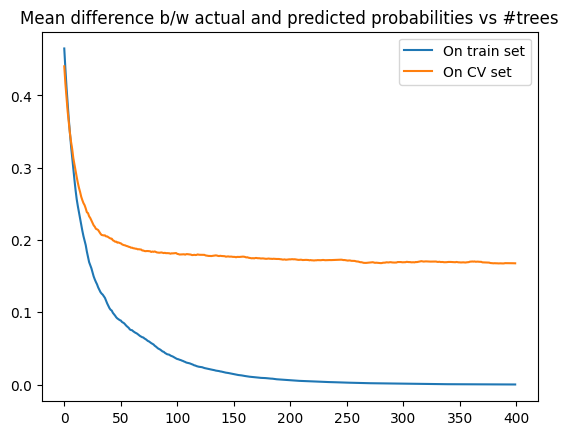

In [294]:
plt.plot(GBC.train_error_hist, label='On train set')
plt.plot(GBC.cv_error_hist, label='On CV set')
plt.title("Mean difference b/w actual and predicted probabilities vs #trees")
plt.legend()

In [295]:
GBC_train_pred = GBC.predict(X_train, GBC.trees, enable_thresh=True)

In [296]:
#Performance on the training set
_, _, _, _, _ = evaluate_model_performance(y_train, GBC_train_pred)

Accuracy: 1.0
Precision: 1.0 | Recall: 1.0
F1 Score: 1.0


In [297]:
GBC_cv_pred = GBC.predict(X_cv, GBC.trees, enable_thresh=True)

In [298]:
#Performance on the cross-validation set
GBC_confusion_matrix, GBC_accuracy, GBC_precision, GBC_recall, GBC_F1_score = evaluate_model_performance(y_cv, GBC_cv_pred)

Accuracy: 0.8431372549019608
Precision: 0.7045454545454546 | Recall: 0.7380952380952381
F1 Score: 0.7209302325581395


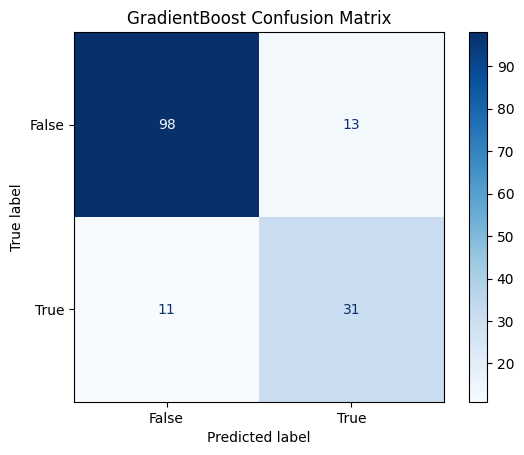

In [299]:
GBC_cm_plot = metrics.ConfusionMatrixDisplay(confusion_matrix = GBC_confusion_matrix, display_labels = [False, True])
GBC_cm_plot.plot(cmap='Blues')
plt.title('GradientBoost Confusion Matrix')
plt.show()

## Comparing the models

In [301]:
models = ['LinearRegression', 'ANN', 'DecisionTree', 'Bagging', 'RandomForest', 'AdaBoost', 'GradientBoost']
F1_scores = [LR_F1_score, ANN_F1_score, DT_F1_score, BC_F1_score, RF_F1_score, ABC_F1_score, GBC_F1_score]
precision_values = [LR_precision, ANN_precision, DT_precision, BC_precision, RF_precision, ABC_precision, GBC_precision]
recall_values = [LR_recall, ANN_recall, DT_recall, BC_recall, RF_recall, ABC_recall, GBC_recall]
accuracies = [LR_accuracy, ANN_accuracy, DT_accuracy, BC_accuracy, RF_accuracy, ABC_accuracy, GBC_accuracy]

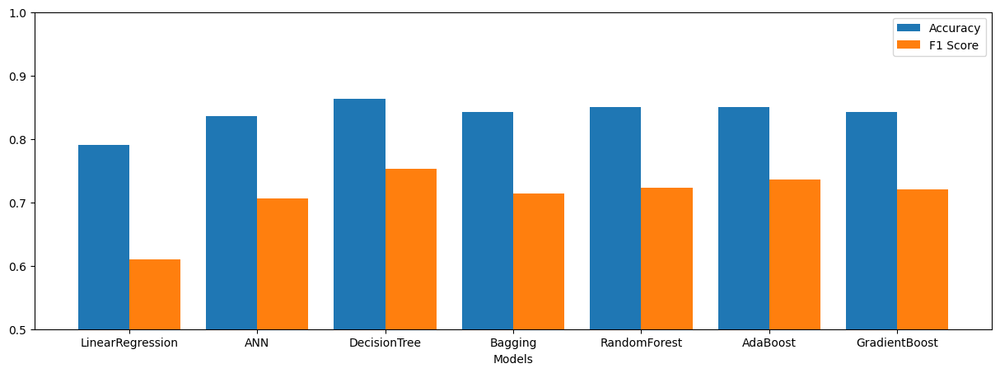

In [303]:
fig, ax = plt.subplots(figsize = (15, 5))
X_axis = np.arange(len(models))
ax.bar(X_axis - 0.2, accuracies, 0.4, label = 'Accuracy') 
ax.bar(X_axis + 0.2, F1_scores, 0.4, label = 'F1 Score') 
ax.set_ylim(0.50, 1.0)

plt.xticks(X_axis, models)
plt.xlabel("Models")
plt.legend()

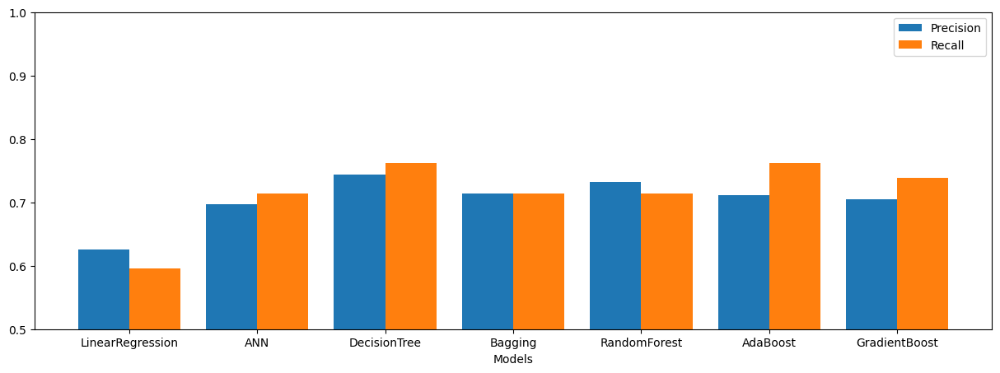

In [305]:
fig2, ax2 = plt.subplots(figsize = (15, 5))
X_axis_ = np.arange(len(models))
ax2.bar(X_axis_ - 0.2, precision_values, 0.4, label = 'Precision') 
ax2.bar(X_axis_ + 0.2, recall_values, 0.4, label = 'Recall') 
ax2.set_ylim(0.50, 1.0)

plt.xticks(X_axis, models)
plt.xlabel("Models")
plt.legend()

Imputation using Random Forest Significantly increased the performance. Simple imputation strategies, like using mean or median, yield relatively poor performance.